In [1]:
import networkx as nx
import pickle
import osmnx as ox
import heapq
import pandas as pd
import matplotlib.pyplot as plt
import geopy.distance as dist
import numpy as np
import math

DROPOFF_LAT = 'dropoff_latitude'
DROPOFF_LONG = 'dropoff_longitude'
PICKUP_LAT = 'pickup_latitude'
PICKUP_LONG = 'pickup_longitude'
PICKUP_TIME = 'tpep_pickup_datetime'
TRIP_DISTANCE = 'trip_distance'
ORIGIN = 'origin'
DEST = 'dest'

Manhattan_network = pickle.load(open("Manhattan_network.p", "rb"))
shortest_path_length=dict(nx.all_pairs_dijkstra_path_length(Manhattan_network, weight='length'))
shortest_paths = nx.shortest_path(Manhattan_network)
selected = pd.read_csv("manhatton_demand.csv",parse_dates=True).sort_values(by = [PICKUP_TIME])

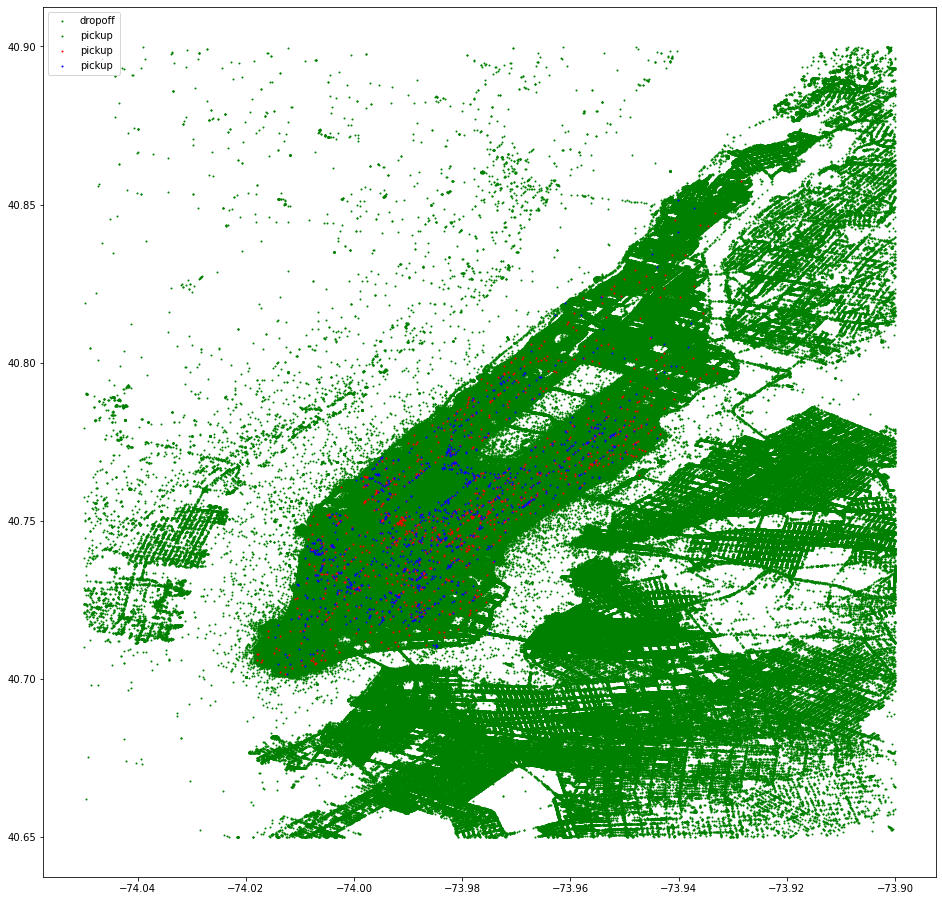

In [22]:
def visualize_demand(data,selected,min_pickup_time, max_pickup_time):
    '''
    Inputs: the pickup time and location range
    '''
    #TODO: Go through the demand data to find the demand data in the range. 
    rslt_df = data.loc[(data[PICKUP_TIME] >= min_pickup_time) & 
                            (data[PICKUP_TIME] <= max_pickup_time)]
    
    #TODO: Plot all the correponding dropoff locations. 
    fig = plt.figure(figsize=(16,16))
    ax1 = fig.add_subplot(111)
    ax1.scatter(x=rslt_df[DROPOFF_LONG],y=rslt_df[DROPOFF_LAT],c='g',label='dropoff',s=1)
    ax1.scatter(x=rslt_df[PICKUP_LONG],y=rslt_df[PICKUP_LAT],c='g',label='pickup',s=1)
    ax1.scatter(x=selected[DROPOFF_LONG],y=selected[DROPOFF_LAT],c='r',label='pickup',s=1)
    ax1.scatter(x=selected[PICKUP_LONG],y=selected[PICKUP_LAT],c='b',label='pickup',s=1)
    plt.legend(loc='upper left');
    plt.show()

visualize_demand(boundData,selected,"2015-01-01 00:00:00","2015-01-31 01:00:00")

In [1]:
def visualize_path(G, routes):
    '''
    G: networkx file
    path: the list of edges in the shortest path
    '''
    ox.plot.plot_graph_routes(G, routes, route_linewidth=10, orig_dest_size=100, figsize=(128, 128))

visualize_path(Manhattan_network, buslines)

NameError: name 'Manhattan_network' is not defined

In [3]:
def saveStructureToFile(value,filename):
    afile = open(filename+'.pkl', 'wb')
    pickle.dump(value, afile)
    afile.close()

def loadValueFromFile(name):
    afile = open(name+'.pkl', 'rb')
    value = pickle.load(afile)
    afile.close()
    return value

/home/dan/miniconda3/envs/osmnx/lib/python3.9/site-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/home/dan/miniconda3/envs/osmnx/lib/python3.9/site-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


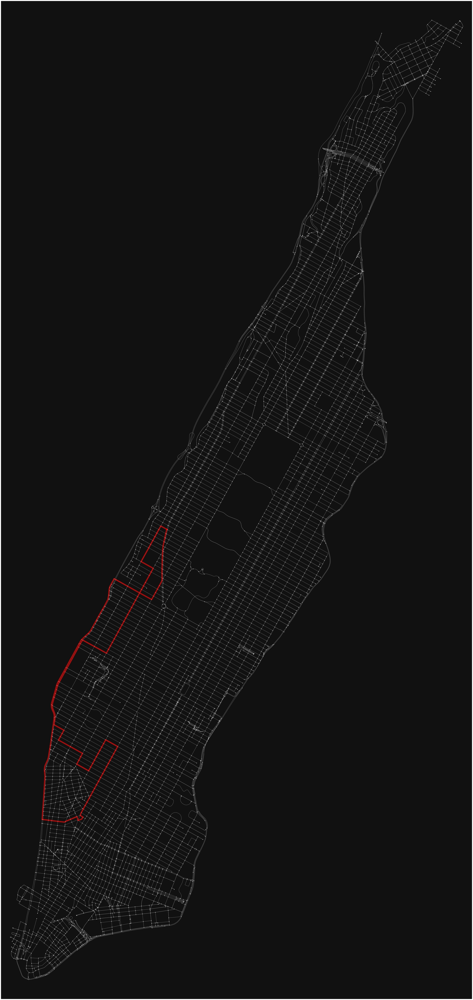

In [5]:
def visualize_route(G, route):
    '''
    G: networkx file
    path: the list of edges in the shortest path
    '''
#     ox.plot.plot_graph_route(G, routes, route_colors =['r','b'],route_linewidth=10, orig_dest_size=100, figsize=(128, 128))
    ox.plot.plot_graph_route(G, route,route_linewidth=10, orig_dest_size=100, figsize=(128, 128))

visualize_route(Manhattan_network, buslines[0]["route"])


In [ ]:
def generate_plots(G, routes):
    '''
    G: networkx file
    path: the list of edges in the shortest path
    '''
#     ox.plot.plot_graph_route(G, routes, route_colors =['r','b'],route_linewidth=10, orig_dest_size=100, figsize=(128, 128))

    for i in range(len(routes)):
        node_color = []
        edge_color = []
        for node in G.nodes:
            if node in routes[i]["stops"]:
                node_color.append('g')
            else:
                node_color.append('w')
        for edge in G.edges:
            if (edge[0] in routes[i]["route"]) and (edge[1] in routes[i]["route"]):
                edge_color.append('r')
            else:
                edge_color.append('w')
#         return node_color,edge_color
        fig, ax = ox.plot.plot_graph(G, node_color=node_color, edge_color=edge_color, figsize=(128, 128))
        fig.savefig(str(i)+'.png')
        break

generate_plots(Manhattan_network, buslines)

In [22]:
def detectAnomalities(arr,edges):
    for i in range(1,len(arr)):
        cnt = arr.count(i)
        if (arr[i-1],arr[i],0) not in edges:
            return True
    return False

def getUpdatedRoute(route,shortest_paths,shortest_path_lengths,node,max_length):
    closest = 1
    dist_closest = shortest_path_lengths[route[closest]][node]
    new_route = route
    for i in range(2,len(route)-1):
        dist = shortest_path_lengths[route[i]][node]
        if dist < dist_closest:
            dist_closest = dist
            closest = i
#     if dist_closest < max_length:
    new_route = route[:closest-1] + shortest_paths[route[closest-1]][node] + shortest_paths[node][route[closest+1]][1:] + route[closest+2:]
    distance = 0
#     print("removed: ",route[closest-1],route[closest-2])
    if detectAnomalities(new_route,Manhattan_network.edges):
        new_route = route
    for i in range(1,len(new_route)):
        distance += shortest_path_lengths[new_route[i-1]][new_route[i]]
    return new_route,distance

def smoothenRoute(route):
    newroute = route
    duplicates = []
    for i in route:
        cnt = route.count(i)
        if cnt > 1:
            duplicates.append(i)

    for i in duplicates:
        dups = []
        for j in range(len(newroute)):
            if newroute[j] == i:
                dups.append(j)
        if len(dups) > 1:
            fst = dups[0]
            snd = dups[1]
            if abs(fst-snd) < len(newroute)/10:
                newroute = newroute[:fst]+newroute[snd:]
    return newroute

def generateStops(shortest_path_lengths,route,minLength):
    stops = [route[0]]
    distances = [0]
    distanceFromLastStop = 0
    distanceFromStart = 0
    for i in range(1,len(route)):
        distanceFromLastStop += shortest_path_lengths[route[i-1]][route[i]]
        distanceFromStart += shortest_path_lengths[route[i-1]][route[i]]
        if distanceFromLastStop > minLength:
            stops.append(route[i])
            distances.append(distanceFromStart)
            distanceFromLastStop = 0
    
    distances_between_stops = {}
    for i,stop1 in enumerate(stops):
        if stop1 not in distances_between_stops:
            distances_between_stops[stop1] = {}
        for j,stop2 in enumerate(stops):
                if stop1 != stop2:
                    if i < j:
                        distance_between = distances[j]-distances[i]
                        if stop2 not in distances_between_stops[stop1]:
                            distances_between_stops[stop1][stop2] = (distance_between,0)
                        if distance_between < distances_between_stops[stop1][stop2][0]
                    distances_between_stops[stop1][stop2]
    return stops,distances

def getRouteLength(shortest_path_lengths,route):
    routeLength = 0
    for i in range(1,len(route)):
        routeLength += shortest_path_lengths[route[i-1]][route[i]]
    return routeLength

def validSample(sample,shortest_path_lengths):
    for index, row in sample.iterrows():
        origin = sample.iloc[0][ORIGIN]
        dest = sample.iloc[0][DEST]
        if origin == dest:
            return False
        if origin not in shortest_path_lengths:
            return False
        if dest not in shortest_path_lengths:
            return False
    return True

def getNoOfBussesWaitTime(route_length,frequency,speed):
    travel_time = route_length/(speed*1000)
    no_of_busses =  math.ceil(travel_time*frequency)
    waiting_time = (no_of_busses/frequency)-travel_time
    return no_of_busses, waiting_time

def generateBusLines(G,shortest_paths,shortest_path_lengths,demand,ave_length,route_count,speed):
    routes = []
    while len(routes) < route_count:
        minimum_route_length = ave_length+np.random.randint(1,10)*(ave_length/5)
        freq = np.random.choice([1,2,3,4,6])
        sample = demand.sample(n=50)
        try:
            if validSample(sample,shortest_path_lengths):
                route = shortest_paths[sample.iloc[0][ORIGIN]][sample.iloc[0][DEST]] + shortest_paths[sample.iloc[0][DEST]][sample.iloc[0][ORIGIN]][1:]
                route_distance = shortest_path_lengths[sample.iloc[0][ORIGIN]][sample.iloc[0][DEST]] + shortest_path_lengths[sample.iloc[0][DEST]][sample.iloc[0][ORIGIN]]
                for index, row in sample.iterrows():
                    if route_distance > minimum_route_length:
                        break
                    origin = row[ORIGIN]
                    dest = row[DEST]
                    if origin not in route:
                        route,route_distance = getUpdatedRoute(route,shortest_paths,shortest_path_lengths,origin,minimum_route_length-route_distance)
                    if dest not in route:
                        route,route_distance = getUpdatedRoute(route,shortest_paths,shortest_path_lengths,dest,minimum_route_length-route_distance)
                smoothen = smoothenRoute(route)
                stops, distances = generateStops(shortest_path_lengths,smoothen,500)
                route_length = getRouteLength(shortest_path_lengths,smoothen)
                no_of_busses, waiting_time = getNoOfBussesWaitTime(route_length,freq,speed)
                route_entry = {"count":no_of_busses,"wait":waiting_time,"route":smoothen,"frequency":freq,"stops":stops,"length":route_length,"distances":distances}
                routes.append(route_entry)
        except KeyError:
            print("Key error occured")
    return routes

def getServableRoutes(G,routes,shortest_path_lengths,cutoff):
    servableRoutes = {}
    closestToStop = {}
    closestFromStop = {}
    key_errors = 0
    for node in G.nodes:
        servableRoutes[node] = []
        closestToStop[node] = {}
        closestFromStop[node] = {}
    size = len(routes)
    for i in range(size):
        route = routes[i]["route"]
        stops = routes[i]["stops"]
        for stop in stops:
            for node in G.nodes:
                try:
                    distance = min(shortest_path_lengths[node][stop],shortest_path_lengths[stop][node])
                    if distance <= cutoff:
                        if i not in servableRoutes[node]:
                            servableRoutes[node].append(i)
                            closestToStop[node][i] = stop
                            closestFromStop[node][i] = stop
                        current_close_stop = closestToStop[node][i]
                        current_distance = shortest_path_lengths[node][current_close_stop]
                        if shortest_path_lengths[node][stop] < current_distance:
                            closestToStop[node][i] = stop
                        current_from_stop = closestFromStop[node][i]
                        current_distance = shortest_path_lengths[current_from_stop][node]
                        if shortest_path_lengths[stop][node] < current_distance:
                            closestFromStop[node][i] = stop
                except KeyError:
                    key_errors+=1
    return servableRoutes,closestToStop,closestFromStop

buslines = generateBusLines(Manhattan_network,shortest_paths,shortest_path_length,selected,10000,100,10)
servable_routes,closest_to_stop,closest_from_stop = getServableRoutes(Manhattan_network,buslines,shortest_path_length,1000)

Key error occured


/home/dan/miniconda3/envs/osmnx/lib/python3.9/site-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/home/dan/miniconda3/envs/osmnx/lib/python3.9/site-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


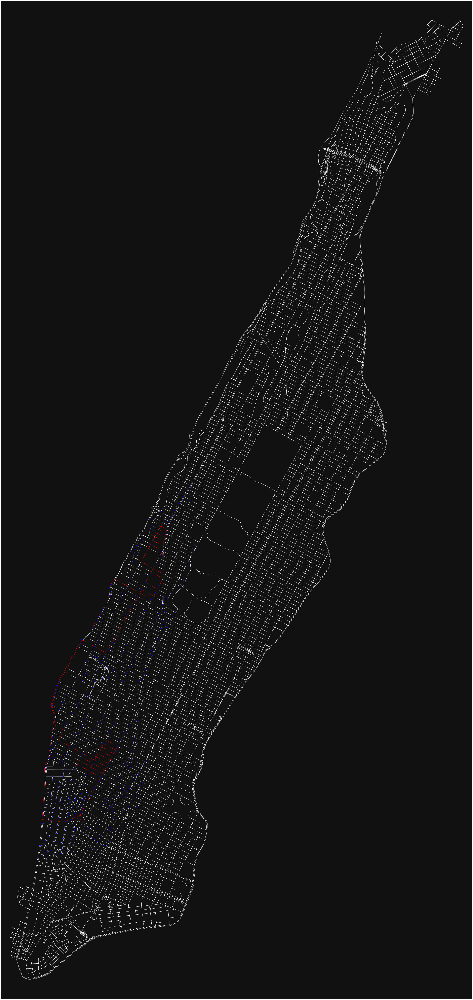

In [10]:
def show_servicable_nodes(G, route,servable_routes,route_no):
    '''
    G: networkx file
    path: the list of edges in the shortest path
    '''
#     ox.plot.plot_graph_route(G, routes, route_colors =['r','b'],route_linewidth=10, orig_dest_size=100, figsize=(128, 128))

    node_color = []
    edge_color = []
    for node in G.nodes:
        if route_no in servable_routes[node]:
            node_color.append('b')
        else:
            node_color.append('w')
    for edge in G.edges:
        if (edge[0] in route) and (edge[1] in route):
            edge_color.append('r')
        else:
            edge_color.append('w')

    ox.plot.plot_graph(G, node_color=node_color, edge_color=edge_color, figsize=(128, 128))
    
show_servicable_nodes(Manhattan_network, buslines[0]["route"],servable_routes,0)

In [25]:
# cnt = 0
# for i in range(100):
#     cnt+= buslines[i]["length"]
# print(cnt/100)

[i for i,x in enumerate(["foo", "bar", "baz","bar"]) if x == 'bar']

[1, 3]

In [21]:
def getBusDetails(busline,shortest_path_lengths,start_node,end_node,start_time,end_time):
    distance_to_start = 0
    distance_between_nodes = 0
    stops = busline["stops"]
    distances = busline["distances"]
    start_indices = [i for i,x in enumerate() if x == start_node]
    end_indices = [i for i,x in enumerate(stops) if x == end_node]
    start_apprearances = len(start_indices)
    end_apprearances = len(end_indices)
    if start_indices[0] < end_indices[0]:
        selected_start = 
        shortest_distance = distances[end_indices[0]]-distances[start_indices[0]]
        if start_apprearances == 2 and end_apprearances == 2:
            distance = distances[end_indices[1]]-distances[start_indices[1]]
            if distance < shortest_distance:
                


def generateRBCombinations(G,buslines,shortest_paths,shortest_path_lengths,servable_routes,closest_to_stop,closest_from_stop,requests):
    combinations = {}
    for index, row in requests.iterrows():
        latest_arrival = 12
        origin = row[ORIGIN]
        dest = row[DEST]
        bus_lines_close_to_origin = servable_routes[origin]
        bus_lines_close_to_dest = servable_routes[dest]
        # get single bus trips
        for line in bus_lines_close_to_origin:
            if line in bus_lines_close_to_dest:
                start = closest_to_stop[origin][line]
                end = closest_from_stop[dest][line]
                time_at_start = row[PICKUP_TIME]+shortest_path_lengths[origin][start]
                time_at_end = latest_arrival - shortest_path_lengths[end][dest]
        # get transfer bus trips
        for line1 in bus_lines_close_to_origin:
            for line2 in bus_lines_close_to_dest:
                if line1 != line2:
                    
        
        

(27276.60960318354, 9, 3, 0.2723390396816461)